# Discription:
datasets are included, related to red and white vinho verde wine samples, from the north of Portugal. The goal is to model wine quality based on physicochemical tests.

Source:Paulo Cortez, University of Minho, Guimarães, Portugal, http://www3.dsi.uminho.pt/pcortez


###### Data Set Information:

>The two datasets are related to red and white variants of the Portuguese "Vinho Verde" wine.

>Due to privacy and logistic issues, only physicochemical (inputs) and sensory (the output) variables are available (e.g. there is no data about grape types, wine brand, wine selling price, etc.).

>These datasets can be viewed as classification or regression tasks. 

>The classes are ordered and not balanced (e.g. there are many more normal wines than excellent or poor ones). 

>Outlier detection algorithms could be used to detect the few excellent or poor wines. Also, we are not sure if all input variables are relevant. So it could be interesting to test feature selection methods.


#### Attribute Information:

Input variables (based on physicochemical tests):
1 - fixed acidity

2 - volatile acidity

3 - citric acid

4 - residual sugar

5 - chlorides

6 - free sulfur dioxide

7 - total sulfur dioxide

8 - density

9 - pH

10 - sulphates

11 - alcohol

Output variable (based on sensory data):

12 - quality (score between 0 and 10)



In [80]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import  GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, accuracy_score
from pandas_profiling import ProfileReport
from sklearn.metrics import plot_confusion_matrix
from sklearn.utils import shuffle
from sklearn.impute import KNNImputer
from sklearn.model_selection import train_test_split
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import plot_confusion_matrix

In [4]:
df=pd.read_csv("winequality-red.csv")
len(df)

1599

In [5]:
df=df.drop_duplicates()
len(df)

1359

In [5]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
df.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

In [7]:
df.isnull().any()

fixed acidity           False
volatile acidity        False
citric acid             False
residual sugar          False
chlorides               False
free sulfur dioxide     False
total sulfur dioxide    False
density                 False
pH                      False
sulphates               False
alcohol                 False
quality                 False
dtype: bool

In [8]:
df.head(5)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
5,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5


In [9]:
x=df.drop(columns='quality')
y=df.quality
x.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8
5,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4


In [10]:
y.tail()

1593    6
1594    5
1595    6
1597    5
1598    6
Name: quality, dtype: int64

In [11]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.10,random_state=20)

In [12]:
len(x_train),len(y_train),len(x_test),len(y_test)

(1223, 1223, 136, 136)

##### let's fit  the model:DecisionTreeClassifier()

In [13]:
model=DecisionTreeClassifier(criterion='gini')
model.fit(x_train,y_train)

DecisionTreeClassifier()

In [14]:
model.score(x_test,y_test)

0.5147058823529411

###### tuning hyperperameter

In [15]:
model1=DecisionTreeClassifier(criterion='entropy')
model1.fit(x_train,y_train)

DecisionTreeClassifier(criterion='entropy')

In [16]:
model1.score(x_test,y_test)

0.4632352941176471

In [17]:
## pruning:
path= model.cost_complexity_pruning_path(x_train,y_train)
ccp_alpha=path.ccp_alphas

In [18]:
dt_model2=[]
for ccp in ccp_alpha:
    dt_m=DecisionTreeClassifier( ccp_alpha=ccp)
    dt_m.fit(x_train,y_train)
    dt_model2.append(dt_m)

In [19]:
dt_model2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.000681384573453257),
 DecisionTreeClassifier(ccp_alpha=0.0007008527041233502),
 DecisionTreeClassifier(ccp_alpha=0.0007008527041233502),
 DecisionTreeClassifier(ccp_alpha=0.0007268102116834741),
 DecisionTreeClassifier(ccp_alpha=0.0007358953393295178),
 DecisionTreeClassifier(ccp_alpha=0.0007433286255853714),
 DecisionTreeClassifier(ccp_alpha=0.0007495230307985827),
 DecisionTreeClassifier(ccp_alpha=0.0007547644505943767),
 DecisionTreeClassifier(ccp_alpha=0.0007547644505943767),
 DecisionTreeClassifier(ccp_alpha=0.0007547644505943767),
 DecisionTreeClassifier(ccp_alpha=0.0007547644505943767),
 DecisionTreeClassifier(ccp_alpha=0.000763150722267648),
 DecisionTreeClassifier(ccp_alpha=0.0007665576451349142),
 DecisionTreeClassifier(ccp_alpha=0.000769563753547208),
 DecisionTreeClassifier(ccp_alpha=0.000769563753547208),
 DecisionTreeClassifier(ccp_alpha=0.0007722358499136914),
 DecisionTreeClassifier(ccp_alpha=0.0007722358499

In [20]:
### let's the test and train score:
train_score=[]
test_score=[]

for i in dt_model2:
    train_score.append(i.score(x_train,y_train))
    

for j in dt_model2:
    test_score.append(j.score(x_test,y_test))


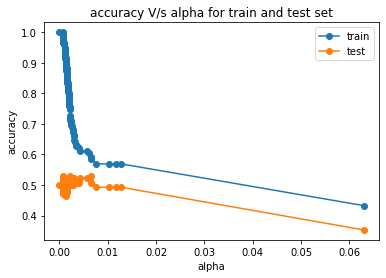

In [21]:
fig,ax=plt.subplots()
ax.set_xlabel('alpha')
ax.set_ylabel('accuracy')
ax.set_title("accuracy V/s alpha for train and test set")

ax.plot(ccp_alpha,train_score,label='train',marker='o')
ax.plot(ccp_alpha,test_score,label='test',marker='o')
ax.legend();

In [26]:
df_model_ccp=DecisionTreeClassifier(ccp_alpha=0.007)
df_model_ccp.fit(x_train,y_train)

DecisionTreeClassifier(ccp_alpha=0.007)

In [27]:
df_model_ccp.score(x_train,y_train)

0.5854456255110384

In [28]:
df_model_ccp.score(x_test,y_test)

0.5294117647058824

#### searching other best possible parameter:

In [33]:
grid_pram = {"criterion":['gini','entropy'],
             "splitter":['best','random'],
             "max_depth" : range(2,40,1),
             "min_samples_split":range(2,10 ,1),
             "min_samples_leaf":range(1,10,1),
             
             }
grid_ccp = GridSearchCV(estimator=df_model_ccp,param_grid=grid_pram , cv = 5 , n_jobs=-1)

In [34]:
grid_ccp.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(ccp_alpha=0.007), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 40),
                         'min_samples_leaf': range(1, 10),
                         'min_samples_split': range(2, 10),
                         'splitter': ['best', 'random']})

In [35]:
grid_ccp.best_params_

{'criterion': 'entropy',
 'max_depth': 21,
 'min_samples_leaf': 8,
 'min_samples_split': 9,
 'splitter': 'random'}

In [90]:
dt_cpp_new = DecisionTreeClassifier( criterion='gini' , 
                                    #max_depth=21 ,
                                    min_samples_leaf=5 ,
                                    ccp_alpha=0.007     
                                  )
dt_cpp_new.fit(x_train,y_train)

DecisionTreeClassifier(ccp_alpha=0.007, min_samples_leaf=5)

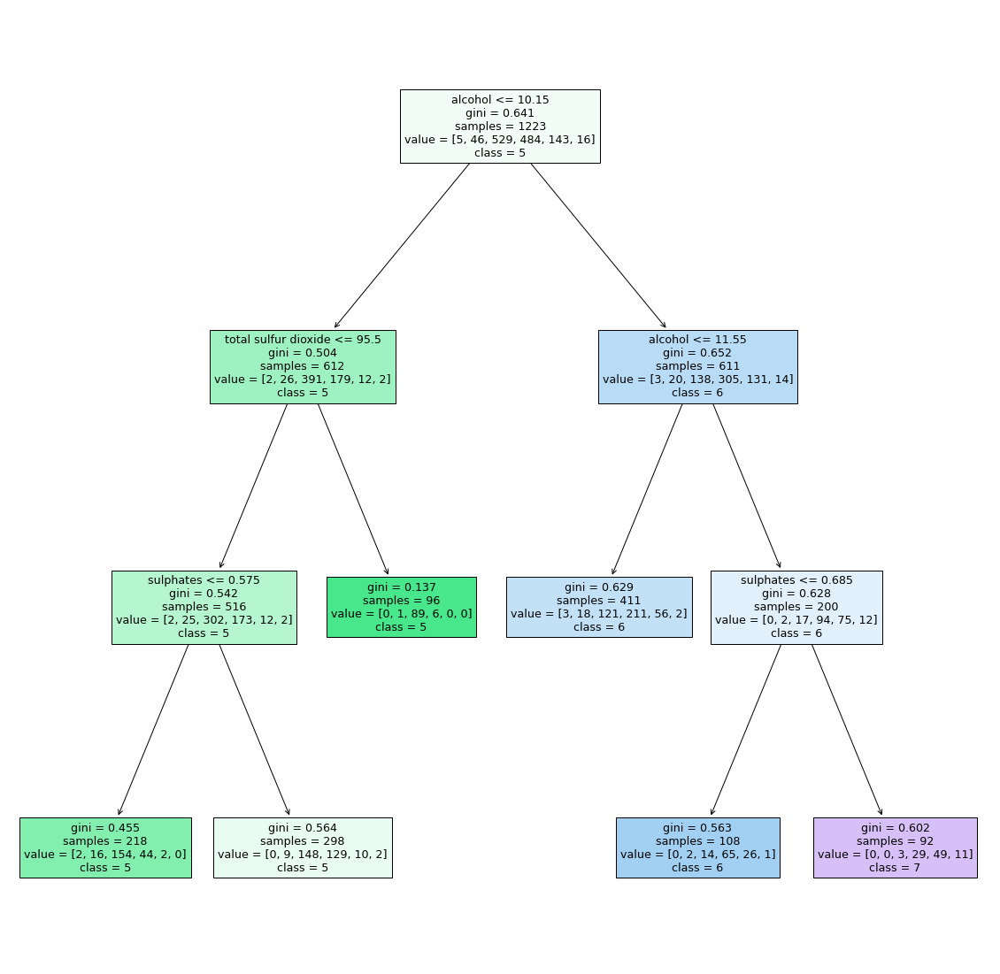

In [96]:
%matplotlib inline
plt.figure(figsize=(20,20))
tree.plot_tree(dt_cpp_new,filled=True,feature_names=x_train.columns,class_names=[str(i) for i in set(y_train)]);

In [92]:
dt_cpp_new.score(x_train,y_train)

0.5854456255110384

In [93]:
score=dt_cpp_new.score(x_test,y_test)
print(f"Model score on test set: {(score*100):.2f}%")


Model score on test set: 52.94%


In [73]:
pred = dt_cpp_new.predict(x_test)
pred

array([5, 6, 6, 5, 5, 5, 5, 5, 5, 6, 5, 6, 5, 5, 6, 6, 5, 6, 5, 5, 6, 6,
       5, 6, 5, 6, 5, 6, 5, 5, 6, 6, 6, 5, 6, 5, 6, 7, 5, 5, 6, 7, 7, 5,
       6, 5, 6, 5, 5, 6, 6, 6, 6, 7, 5, 5, 5, 5, 6, 6, 5, 6, 5, 6, 5, 6,
       5, 5, 5, 5, 5, 7, 5, 6, 5, 5, 5, 6, 6, 5, 6, 5, 7, 5, 5, 6, 6, 5,
       6, 6, 6, 6, 6, 5, 5, 6, 5, 7, 6, 6, 5, 7, 5, 7, 6, 6, 6, 6, 6, 5,
       6, 5, 6, 5, 5, 5, 6, 5, 6, 7, 5, 6, 6, 6, 5, 6, 6, 7, 6, 5, 5, 6,
       5, 6, 5, 6], dtype=int64)

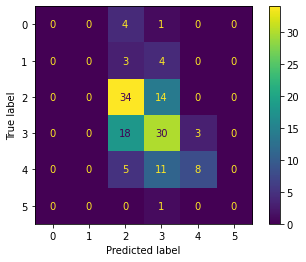

In [77]:
cm=confusion_matrix(y_test,pred)
cm_display = ConfusionMatrixDisplay(cm).plot()

D:\env\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


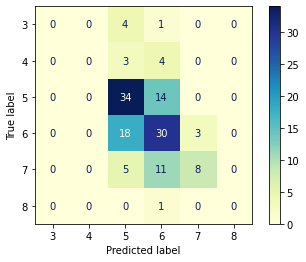

In [79]:
## detail report:
plot_confusion_matrix(dt_cpp_new, x_test, pd.DataFrame(y_test),cmap='YlGnBu');

In [83]:
import sklearn 
report=sklearn.metrics.classification_report(y_test, pd.DataFrame(pred))
print(report)

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         5
           4       0.00      0.00      0.00         7
           5       0.53      0.71      0.61        48
           6       0.49      0.59      0.54        51
           7       0.73      0.33      0.46        24
           8       0.00      0.00      0.00         1

    accuracy                           0.53       136
   macro avg       0.29      0.27      0.27       136
weighted avg       0.50      0.53      0.50       136



D:\env\lib\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\env\lib\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\env\lib\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [86]:
y_preds=[]
for i in pred:
    y_preds.append(i)
## how correct our prediction are:
pred_df = pd.DataFrame({
                        "y_true":y_test,
                        "y_pred":y_preds,
                        
                              })
                        
# 3. Is the prediction correct?
pred_df["pred_correct"] = pred_df["y_true"] == pred_df["y_pred"]
pred_df[:]

,y_true,y_pred,pred_correct
134,6,5,False
584,7,6,False
1594,5,6,False
542,5,5,True
1494,7,5,False
...,...,...,...
1536,6,6,True
646,5,5,True
358,7,6,False
600,4,5,False
